# Projeto Final de EA999

Aluno: Otávio Leite Bastos

Prof. Lotufo

## Referências

https://www.kaggle.com/moltean/fruits/data


## Imports

In [ ]:
import numpy as np
import torchvision
import torch
from torch import nn
import torchvision.transforms as T
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torch.nn.functional as F
from tqdm import tqdm_notebook as tqdm

## Extração dos Dados

In [ ]:
device = torch.device('cpu')
if torch.cuda.is_available():
    device = torch.device('cuda')
print('GPU available:', device)

GPU available: cuda


In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [ ]:
# Loading data
transforms_train = T.Compose([                              
                              T.Resize((224,224)),
                              T.ToTensor(),
                              T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                              ])

In [ ]:
root = 'fruits-360_dataset/fruits-360/'

In [ ]:
!unzip -q -n "/gdrive/Shared drives/Drive compartilhado EA999/fruits.zip"

## Carregando Dados

In [ ]:
image_data_train = ImageFolder(root + 'Training/', transform=transforms_train)
image_data_test = ImageFolder(root + 'Test/', transform=transforms_train)

In [ ]:
train_loader = DataLoader(dataset=image_data_train,
                          batch_size=20,
                          shuffle=False)

test_loader = DataLoader(dataset=image_data_test,
                         batch_size=20,
                         shuffle=False)

In [ ]:
# Taken from https://stackoverflow.com/questions/48547660/attributeerror-module-pil-image-has-no-attribute-register-extensions#comment85629134_48774620
from PIL import Image
def register_extension(id, extension): Image.EXTENSION[extension.lower()] = id.upper()
Image.register_extension = register_extension
def register_extensions(id, extensions): 
  for extension in extensions: register_extension(id, extension)
Image.register_extensions = register_extensions


print (iter(train_loader).next()[0].shape)
record = iter(train_loader).next()[0]

torch.Size([20, 3, 224, 224])


## Modelo de Classificação

In [ ]:
from torchvision.models.resnet import model_urls
model_urls['resnet34'] = model_urls['resnet34'].replace('https://', 'http://')

model_resnet = torchvision.models.resnet34(pretrained = True)

for param in model_resnet.parameters():
    param.requires_grad = False

# model_resnet.eval()

Downloading: "http://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [ ]:
model_resnet.fc

Linear(in_features=512, out_features=1000, bias=True)

In [ ]:
model_resnet.fc = torch.nn.Identity()
model_resnet.fc

model_resnet = model_resnet.to(device)

### Extração das Features do Resnet18

Créditos: notebook da Laís

Extração das features de output do Resnet18 quando retirada a última camada FC.


In [ ]:
def extract_features(loader, model_to_features, desc_tqdm='Extracting features'):
    model_to_features.eval()
    x_features = torch.tensor([], dtype=torch.float32).to(device)
    y = torch.tensor([], dtype=torch.int64).to(device)
    for b_x, b_y in tqdm(loader,desc=desc_tqdm, leave=False):   # for each training step
        b_x, b_y = b_x.to(device), b_y.to(device)   ## To device
        y_hat = model_to_features(b_x)                 # take features (new x)
        x_features = torch.cat((x_features, y_hat))
        y = torch.cat((y, b_y))
    return x_features,y

In [ ]:

# Extract features train
x_features_train, y_train = extract_features(train_loader,model_resnet,'Extracting features in train')
print('Features in train extracted')

# Extract features valid
x_features_valid, y_valid = extract_features(test_loader,model_resnet,'Extracting features in valid')
print('Features in valid extracted')

Features in train extracted


Features in valid extracted


In [ ]:
dataset_features_train = torch.utils.data.TensorDataset(x_features_train, y_train) ### x = features  y = value to predict
dataset_features_valid = torch.utils.data.TensorDataset(x_features_valid, y_valid) ### x = features  y = value to predict

In [ ]:
len(dataset_features_train),len(dataset_features_valid)

(60498, 20622)

### Criação do Dataloader

In [ ]:
# Create dataset and loader
#loader_feature_train = torch.utils.data.DataLoader(dataset=dataset_features_train, batch_size=BATCH_SIZE, sampler = sampler) 
loader_feature_train = torch.utils.data.DataLoader(dataset=dataset_features_train, batch_size=500, shuffle=True) 

loader_feature_valid = torch.utils.data.DataLoader(dataset=dataset_features_valid, batch_size=500, shuffle=False)   

### Definição das últimas camadas do modelo


In [ ]:
class MyClassifier(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.fc0 = nn.Linear(in_features=512, out_features=100)
        self.fc1 = nn.Linear(in_features=100, out_features=120)

    def forward(self, x):        
        x = self.fc0(x)       
        x = F.relu(x)
        x = self.fc1(x) 
        
        return x.view(-1, 120)

In [ ]:
model = MyClassifier()

for p in model.parameters():
  p.requires_grad = True
  print(p)

model.to(device)

model.eval() 

Parameter containing:
tensor([[-0.0398,  0.0368, -0.0209,  ..., -0.0109, -0.0058, -0.0109],
        [-0.0417,  0.0376,  0.0385,  ...,  0.0305, -0.0130,  0.0280],
        [ 0.0096, -0.0349,  0.0043,  ..., -0.0441,  0.0432, -0.0161],
        ...,
        [ 0.0098,  0.0306,  0.0168,  ..., -0.0211, -0.0317, -0.0013],
        [-0.0292, -0.0360, -0.0074,  ..., -0.0323,  0.0090,  0.0381],
        [-0.0040, -0.0067,  0.0088,  ...,  0.0137,  0.0058,  0.0310]],
       requires_grad=True)
Parameter containing:
tensor([ 0.0282, -0.0349, -0.0245,  0.0035,  0.0408,  0.0364, -0.0439,  0.0365,
         0.0213,  0.0439,  0.0018, -0.0227,  0.0403, -0.0206,  0.0101,  0.0145,
         0.0268, -0.0285, -0.0143, -0.0437,  0.0078, -0.0258, -0.0132, -0.0278,
        -0.0082,  0.0348, -0.0299,  0.0077, -0.0361, -0.0409, -0.0239, -0.0019,
        -0.0116,  0.0095, -0.0170,  0.0193,  0.0391,  0.0092,  0.0107,  0.0413,
        -0.0103,  0.0379, -0.0266,  0.0174,  0.0157, -0.0308,  0.0059,  0.0263,
         0.0408

MyClassifier(
  (fc0): Linear(in_features=512, out_features=100, bias=True)
  (fc1): Linear(in_features=100, out_features=120, bias=True)
)

## Treinamento do Modelo

### Definição do Otimizador e da Função de Custo

In [ ]:
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)

loss_function = torch.nn.CrossEntropyLoss()

### Treinamento

In [ ]:
loss_his = []

EPOCH = 10

best_loss = 10

for epoch in range(EPOCH):
  for (images,labels) in tqdm(loader_feature_train, leave=False):
    
    optimizer.zero_grad()
    outputs = model(images)
    loss = loss_function(outputs, labels)
    loss.backward()
    optimizer.step()

    loss_his.append(loss)

    if loss < best_loss:
      best_loss = loss
      torch.save(model.state_dict(), 'saved_model')

    n_acertos = 0
    total = 0

    # validação
    for (images,labels) in tqdm(loader_feature_valid, leave=False):
      
      output = model(images.cuda())
      _, predicted = torch.max(output,1)
      n_acertos += (predicted == labels).sum()
      total += labels.size(0)

  print('Epoch [%d], Loss: %.4f' % (epoch+1, loss.item()) )

  print('Acurácia do modelo: %.3f %%' %((100*n_acertos)/(total)))

  print('Menor perda: %.5f ' % best_loss)

Epoch [1], Loss: 0.3475
Acurácia do modelo: 93.000 %
Menor perda: 0.34751 


Epoch [2], Loss: 0.1119
Acurácia do modelo: 96.000 %
Menor perda: 0.10400 


Epoch [3], Loss: 0.0527
Acurácia do modelo: 97.000 %
Menor perda: 0.05208 


Epoch [4], Loss: 0.0350
Acurácia do modelo: 98.000 %
Menor perda: 0.02519 


Epoch [5], Loss: 0.0225
Acurácia do modelo: 98.000 %
Menor perda: 0.01956 


Epoch [6], Loss: 0.0172
Acurácia do modelo: 98.000 %
Menor perda: 0.01239 


Epoch [7], Loss: 0.0141
Acurácia do modelo: 98.000 %
Menor perda: 0.00964 


Epoch [8], Loss: 0.0082
Acurácia do modelo: 98.000 %
Menor perda: 0.00767 


Epoch [9], Loss: 0.0079
Acurácia do modelo: 98.000 %
Menor perda: 0.00557 


Epoch [10], Loss: 0.0080
Acurácia do modelo: 98.000 %
Menor perda: 0.00446 


### Plot do histórico de loss

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


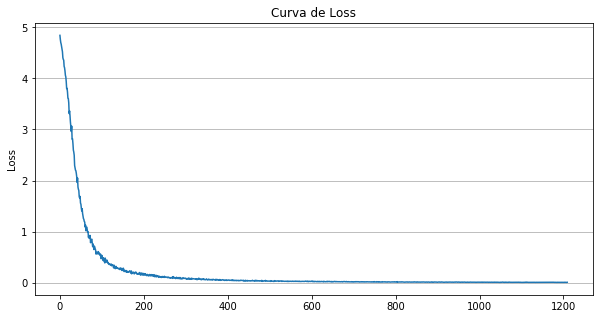

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.title('Curva de Loss')
plt.ylabel('Loss')
ax = plt.axes()        
ax.yaxis.grid() # horizontal lines
plt.plot(loss_his)
plt.show()

### Acurácia Final do Modelo de Perda Mínima

In [ ]:
model.load_state_dict(torch.load('saved_model'))

<All keys matched successfully>

In [ ]:
n_acertos = 0
total = 0

list_labels = torch.tensor([], dtype=torch.int64).to(device)
list_predicted = torch.tensor([], dtype=torch.int64).to(device)

for (images,labels) in tqdm(loader_feature_valid, leave=False):
  
  output = model(images.cuda())
  _, predicted = torch.max(output,1)
  n_acertos += (predicted == labels).sum()
  total += labels.size(0)

  list_labels = torch.cat((list_labels, labels))
  list_predicted = torch.cat((list_predicted, predicted))

print('Acurácia do modelo de perda mínima: %.3f %%' %((100*n_acertos)/(total)))

print('Menor perda: %.5f ' % best_loss)

Acurácia do modelo de perda mínima: 99.000 %
Menor perda: 0.00446 


### Matriz de Confusão, Precision Score e Recall Score

In [ ]:
list_labels

tensor([  0,   0,   0,  ..., 119, 119, 119], device='cuda:0')

In [ ]:
list_predicted

tensor([  0,   0,   0,  ..., 119, 119, 119], device='cuda:0')

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

cm = confusion_matrix(list_labels.cpu(), list_predicted.cpu())

ps = precision_score(y_true=list_labels.cpu(), y_pred=list_predicted.cpu(), average='weighted')

rs = recall_score(y_true=list_labels.cpu(), y_pred=list_predicted.cpu(), average='weighted')

f1_score = f1_score(y_true=list_labels.cpu(), y_pred=list_predicted.cpu(), average='weighted')

print(cm)

print('\n Precision Score: %.3f %%' % (ps*100))

print(' Recall Score: %.3f %%' % (rs*100))

print(' F1 Score: %.3f %%' % (f1_score*100))


[[164   0   0 ...   0   0   0]
 [  0 148   0 ...   0   0   0]
 [  0   0 163 ...   0   0   0]
 ...
 [  0   0   0 ... 127   0   0]
 [  0   0   0 ...   0 153   0]
 [  0   0   0 ...   0   0 249]]

 Precision Score: 99.116 %
 Recall Score: 99.054 %
 F1 Score: 99.046 %


In [ ]:
def plt_confusion_matrix(confusion_matrix):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111) 
    cax = ax.matshow(confusion_matrix, cmap='plasma') 
    plt.title('Confusion matrix') 
    fig.colorbar(cax) 
    plt.xlabel('Predicted') 
    plt.ylabel('Labels') 
    plt.show()

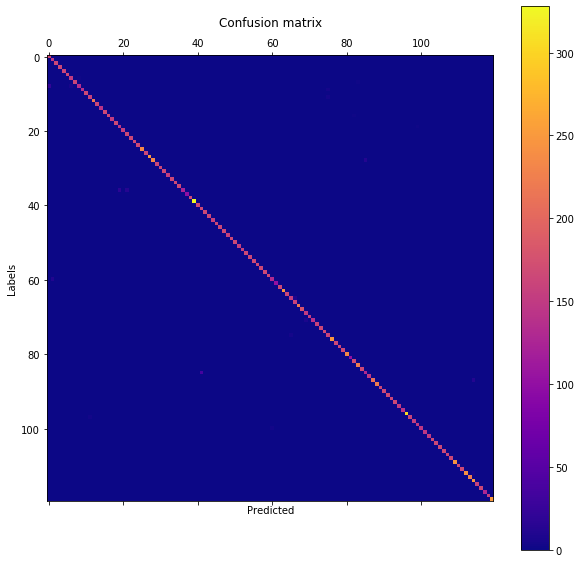

In [ ]:
plt_confusion_matrix(cm)

In [ ]:
len(cm)

120

In [ ]:
cm_zero_diag = cm - cm*np.identity(len(cm))

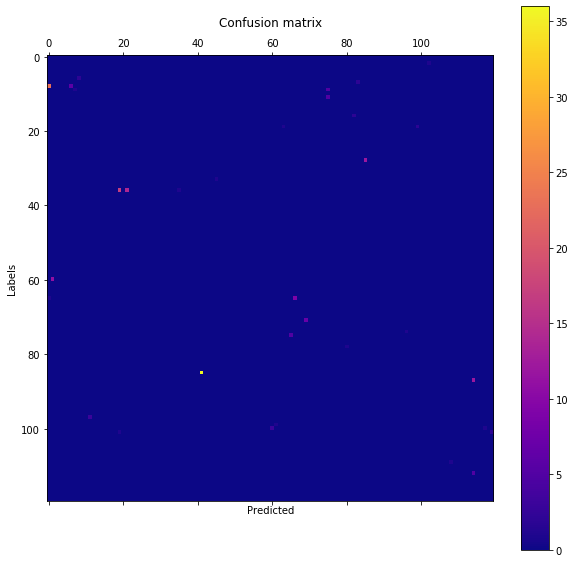

In [ ]:
plt_confusion_matrix(cm_zero_diag)

### Salvando modelo para Parte 3

In [ ]:
torch.save(model.state_dict(),"/gdrive/My Drive/Colab Notebooks/Projeto Final EA999/model_state_dict.pth")